In [1]:
import sys
import gpytorch
import numpy as np
import pandas as pd
import torch
from datetime import datetime, timedelta
from scipy.stats import qmc

from bo_methods_lib.GP_Vs_True_Sensitivity import Compare_GP_True_Movie
from bo_methods_lib.Parm_Sens_Multi_Theta import Param_Sens_Multi_Theta
from bo_methods_lib.scikit_gpytorch_debug import scikit_gpytorch_mul_maps
# from bo_methods_lib.GP_Validation import LOO_Analysis
from bo_methods_lib.bo_functions_generic import round_time, gen_theta_set,gen_x_set, find_train_doc_path, set_ep, clean_1D_arrays

import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300

import warnings
warnings.simplefilter("ignore", category=RuntimeWarning)

from warnings import simplefilter
from sklearn.exceptions import ConvergenceWarning
simplefilter("ignore", category=ConvergenceWarning)

/afs/crc.nd.edu/user/m/mcarlozo/.conda/envs/Toy_Problem_env/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
#Set Date and Time
dateTimeObj = round_time()
timestampStr = dateTimeObj.strftime("%d-%b-%Y (%H:%M:%S)")
print("Date and Time: ", timestampStr)
# DateTime = dateTimeObj.strftime("%Y/%m/%d/%H-%M-%S%p")
DateTime = dateTimeObj.strftime("%Y/%m/%d/%H-%M")
print(DateTime)
# DateTime = "2022/11/29/09-48"
DateTime = None ##For Testing

Date and Time:  08-May-2023 (16:30:00)
2023/05/08/16-30


In [3]:
#Set Parameters
#Need to run at a and b, need 2 arrays to test that this will work
CS = 2.2

Bound_Cut = True
denseX = True
eval_Train = True
eval_theta_num = [-4, -3]

Constants = np.array([[-200,-100,-170,15],
                      [-1,-1,-6.5,0.7],
                      [0,0,11,0.6],
                      [-10,-10,-6.5,0.7],
                      [1,0,-0.5,-1],
                      [0,0.5,1.5,1]])
if CS == 2.2:
    skip_param_types = 1 #This is what changes for subpoint
    true_p = Constants[skip_param_types:skip_param_types+2].flatten()
    param_dict = {0 : 'a_1', 1 : 'a_2', 2 : 'a_3', 3 : 'a_4',
                  4 : 'b_1', 5 : 'b_2', 6 : 'b_3', 7 : 'b_4'}
    exp_d = 2
    if Bound_Cut == True:
        bounds_x = np.array([[-1.0, 0.0],
                            [   0.5, 1.5]])
        if denseX == True:
            n = 30
        else:
            n = 25 #Number of experimental data points to use
    else:    
        bounds_x = np.array([[-1.5, -0.5],
                     [   1,    2]])
        n = 27 #Number of experimental data points to use
    bounds_p = np.array([[-2, -2, -10, -2, -2, -2,  5, -2],
                   [ 2,  2,   0,  2,  2,  2, 15,  2]])

else:
    Constants = true_p = np.array([1,-1])
    skip_param_types = 0
    param_dict = {0 : '\\theta_1', 1 : '\\theta_2'}
    exp_d = 1
    n = 5
    bounds_x = np.array([[-2], [2]])
    bounds_p = np.array([[-2, -2],
                         [ 2,  2]])

# print(Theta_True)
t_list = [20,40]
d = len(true_p)
kernel_func = "Mat_52"
package = "scikit_learn"
train_iter = 300
initialize = 1
noise_std = 0.01
outputscl = False
set_lengthscale = np.linspace(1e-6,1.0,2)
set_lengthscale = 1
verbose = False
norm = False

obj = "obj"

emulator =  True
# save_figure = True
save_figure = False
# save_csvs = True
save_csvs = False

if Bound_Cut == True:
    cut_bounds = '_cut_bounds'
else:
    cut_bounds = ""
    
if denseX == True:
    dense = "_dense"
else:
    dense = ""

#Pull Experimental data from CSV
exp_data_doc = 'Input_CSVs/Exp_Data/d='+str(exp_d)+'/n='+str(n)+cut_bounds+dense+'.csv'
exp_data = np.array(pd.read_csv(exp_data_doc, header=0,sep=","))
Xexp = exp_data[:,1:exp_d+1]
Yexp = exp_data[:,-1]
Xexp = clean_1D_arrays(Xexp)

#Define parameter sensitivity analysis space
value_num = 101 #Number of parameter values for each parameter to evaluate within the bounds
x_space_points = [2,12,23,26]

In [4]:
%%time
#Set Date and Time
dateTimeObj = datetime.now()
timestampStr = dateTimeObj.strftime("%d-%b-%Y (%H:%M:%S)")
print("Date and Time: ", timestampStr)
# DateTime = dateTimeObj.strftime("%Y/%m/%d/%H-%M-%S%p")
DateTime = dateTimeObj.strftime("%Y/%m/%d/%H-%M")
DateTime = None ##For Testing
print("Date and Time Saved: ", DateTime)

all_data_list = []

for t in t_list:
    t_use = int(t*n)
    all_data_doc = find_train_doc_path(emulator, obj, d, t_use, Bound_Cut, denseX)
    print(all_data_doc)
    all_data = np.array(pd.read_csv(all_data_doc, header=0,sep=","))
    all_data_list.append(all_data)
    
print(all_data_list[0].shape)

Date and Time:  08-May-2023 (16:31:07)
Date and Time Saved:  None
Input_CSVs/Train_Data/d=8/all_emul_data/t=600_cut_bounds_dense.csv
Input_CSVs/Train_Data/d=8/all_emul_data/t=1200_cut_bounds_dense.csv
(600, 12)
CPU times: user 8.01 ms, sys: 9.78 ms, total: 17.8 ms
Wall time: 12.6 ms


Case Study:  2.2
Number of Training Thetas:  [20, 40]
Number of Experimental Data Points:  30
GP Emulating Function Output (T) or SSE (F)?  True
Scaling of Objective Function?  obj
Bounds On X Cut (T) or Normal (F)?  True
Dense Grid for Xexp? True
Evaluating Near Test Point (T) or True Parameter Set (F)?  True
GP Training Package:  scikit_learn
GP Training Iterations (Gpytorch only):  300
GP Kernel Function:  Mat_52
GP Kernel has outputscale?:  False
GP Kernel lengthscale:  1
GP Training Restarts (when lengthscale/outputscale not set):  1
Training Data Noise st.dev:  0.01
Number of Values per Parameter:  101
Xexp Points Indecies Evaluated:  [2, 12, 23, 26]


Training Thetas Used:  [20.0, 40.0]
Theta Train for Sensitivity: [-1.234012 -0.609235 -6.084443 -1.11762  -1.434347 -0.337736 12.242987
 -0.577918]
Lengthscale Set To:  ['1.000e+00', '1.000e+00', '1.000e+00', '1.000e+00', '1.000e+00', '1.000e+00', '1.000e+00', '1.000e+00', '1.000e+00', '1.000e+00']
Noise set to  1.000e-04
Outputsca

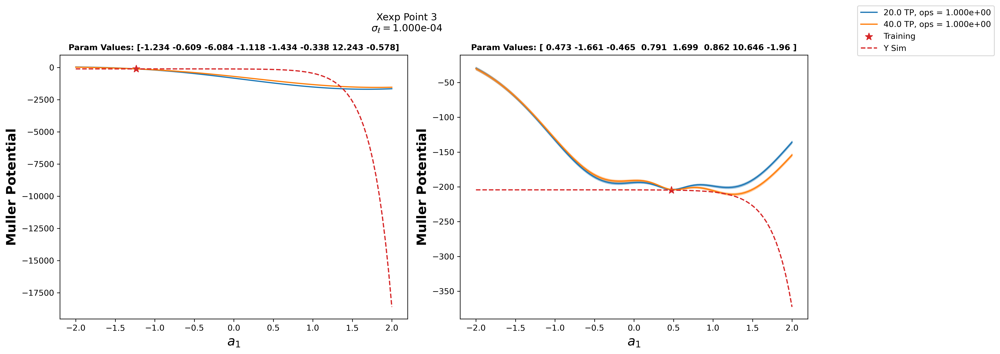

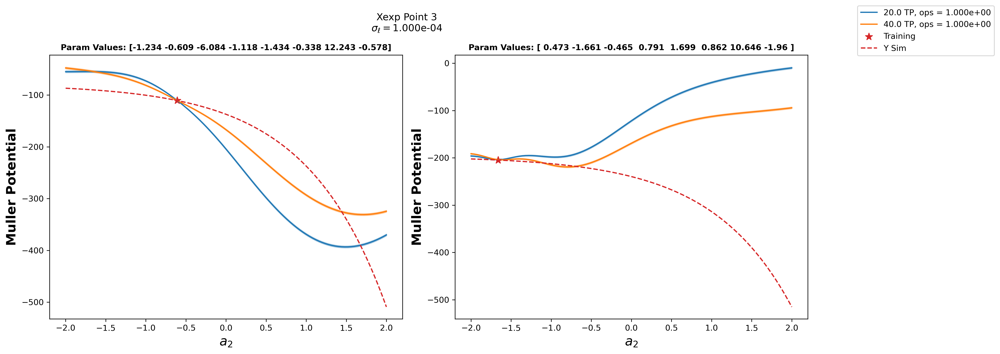

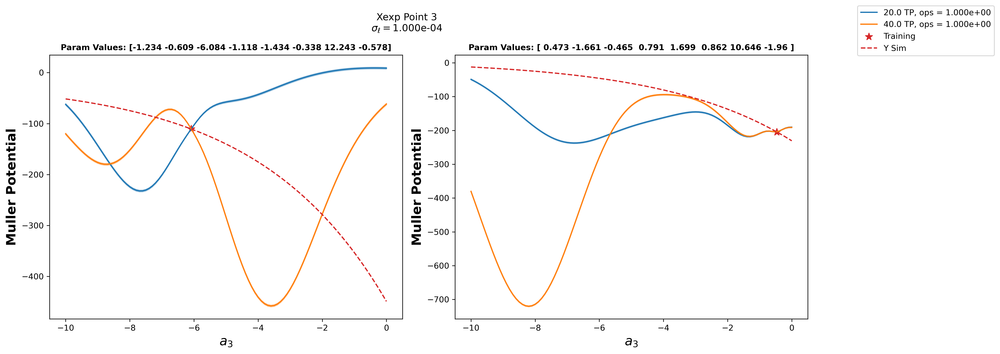

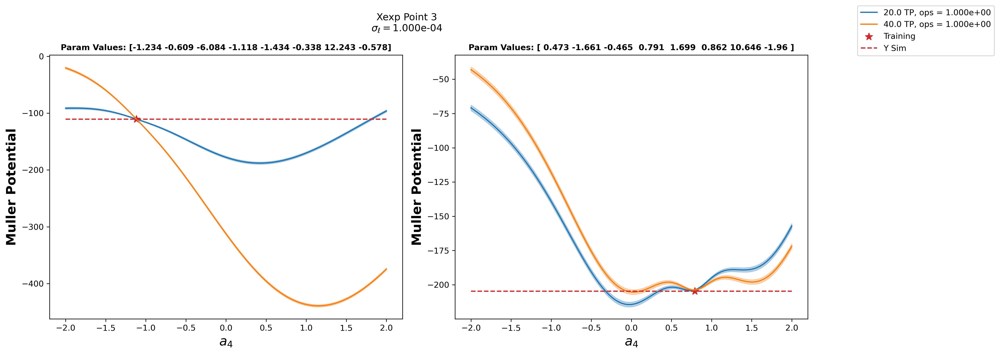

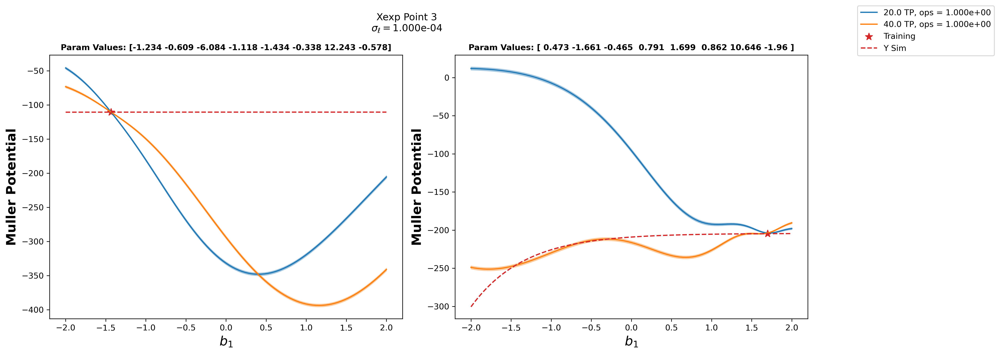

...

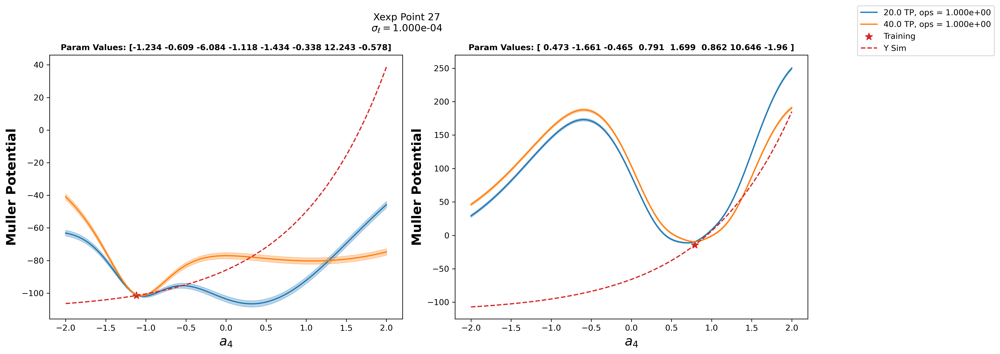

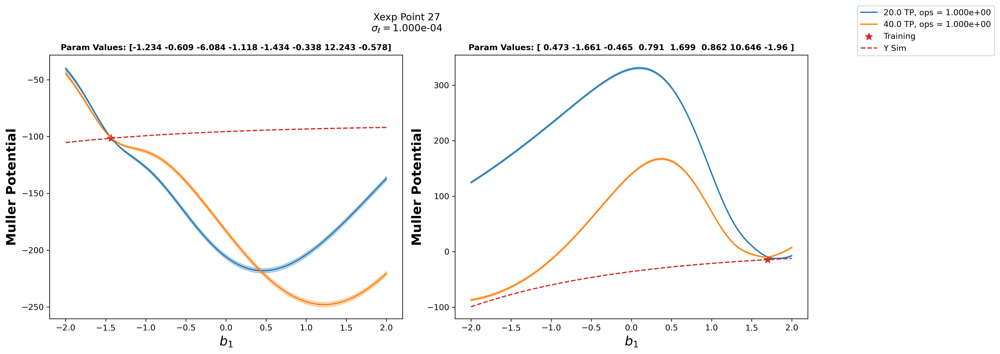

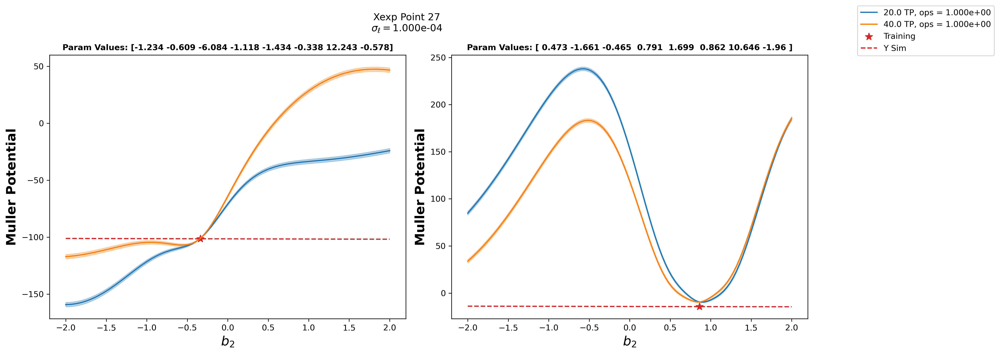

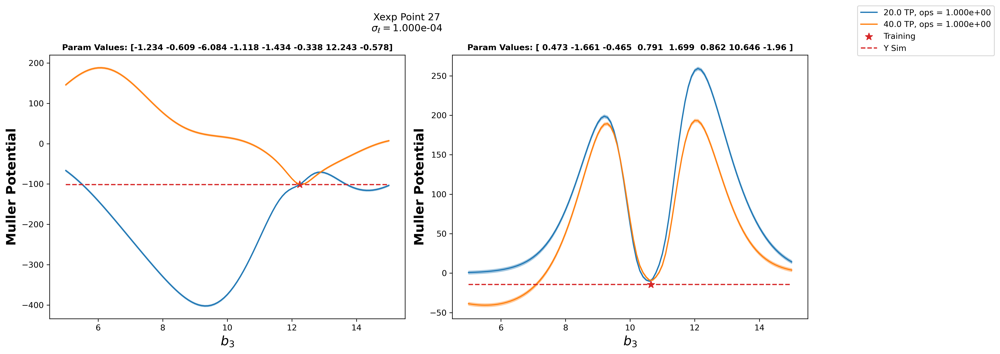

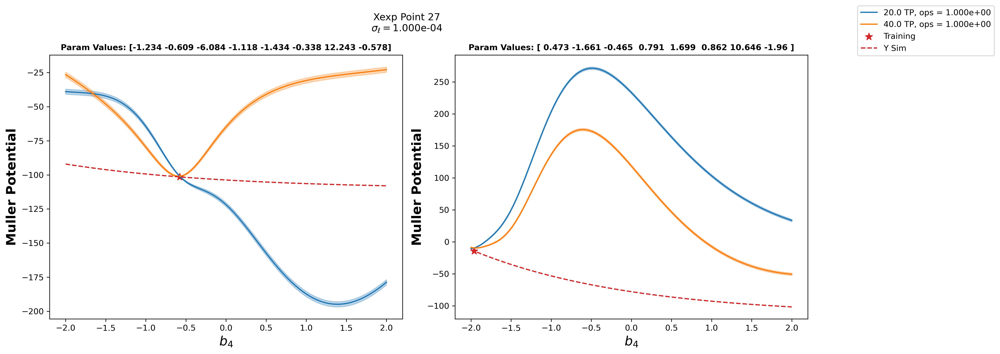

In [5]:
#Define parameter sensitivity analysis space
value_num = 101 #Number of parameter values for each parameter to evaluate within the bounds
x_space_points = [2,12,23,26]

print("Case Study: ", CS)
print("Number of Training Thetas: ", t_list)
print("Number of Experimental Data Points: ", n)
print("GP Emulating Function Output (T) or SSE (F)? ", emulator)
print("Scaling of Objective Function? ", obj)
print("Bounds On X Cut (T) or Normal (F)? ", Bound_Cut)
print("Dense Grid for Xexp?", denseX)
print("Evaluating Near Test Point (T) or True Parameter Set (F)? ", eval_Train)
print("GP Training Package: ", package)
print("GP Training Iterations (Gpytorch only): ", train_iter)
print("GP Kernel Function: ", kernel_func)
print("GP Kernel has outputscale?: ", outputscl)
print("GP Kernel lengthscale: ", set_lengthscale)
print("GP Training Restarts (when lengthscale/outputscale not set): ", initialize)
print("Training Data Noise st.dev: ", noise_std)
print("Number of Values per Parameter: ", value_num)
print("Xexp Points Indecies Evaluated: ", x_space_points)
print("\n")


Param_Sens_Multi_Theta(all_data_list, x_space_points, eval_theta_num, Xexp, Yexp, Constants, true_p, CS, 
                       bounds_p, value_num, skip_param_types, kernel_func, set_lengthscale, 
                       outputscl, train_iter, initialize, noise_std, verbose, DateTime, save_csvs, 
                       save_figure, eval_Train, Bound_Cut, package = package)
print("\n")        